import the needed libraries and functions

In [3]:
import pandas as pd

KMeans - Clustering algorithm /
StandardScaler - Make numbers comparable /
shiluoette_score - Check clustering quality /
PCA - Reduce dimensions for visualization /
plotly - interactive plots

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import plotly.express as px

Loading data into tables 

In [5]:
customer = pd.read_csv("../data/olist_customers_dataset.csv")
orders = pd.read_csv("../data/olist_orders_dataset.csv")
items = pd.read_csv("../data/olist_order_items_dataset.csv")
payments = pd.read_csv("../data/olist_order_payments_dataset.csv")
products = pd.read_csv("../data/olist_products_dataset.csv")
reviews = pd.read_csv("../data/olist_order_reviews_dataset.csv")

Convert dates and remove cancelled orders:

 1. what happens is that all the dates in the column 'order_purchase_timestamp' from orders table are coverted into date/time by pd.to_datetime function

In [6]:
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])

 1. checks row by row 'Is the order_status value either delivered OR shipped?' .From the orders table, order_status column is filtered. Now it only contains either delivered or shipped.

why??? 
 You only want real purchases.
 Canceled / unavailable orders would distort spending behavior. [order status can be - delivered, shipped, cancled, unavailable]

In [7]:
orders = orders[orders['order_status'].isin(['delivered', 'shipped'])]

Remove duplicates rows if any:

In [8]:
orders = orders.drop_duplicates(subset='order_id')

In [9]:
customer = customer.drop_duplicates(subset='customer_id')

Build a customer‑level RFM dataframe

 1. Choose analysis reference date:

 1. Why?

Recency = “How long ago did the customer buy?”

You need a fixed date to measure “how long ago”. 

orders['order_purchase_timestamp'].max() - this returns the largest value of the column, means the latest day if the dataset is real. But if this is a historic dataset ending day of the dataset. // + pd.Timedelta(days=1) -  this add one day to the reference date, because if a customer bought on the last day, recency = max_date -max_date =0. So we add add one day , then there will bie no zeros.

In [10]:
ref_date = orders['order_purchase_timestamp'].max() + pd.Timedelta(days=1)

2. Merge customers with orders to ensure each order has a unique customer. In another way, Orders now know who made them.


In [11]:
orders_cust = orders.merge(customer, on='customer_id', how='left')

 3. Compute Monetary (sum of payments per order) and attach:

payments.groupby('order_id')

, Groups all payment records by order. eg -Order A123 may have 3 payment rows (partial payments, multiple methods). 

['payment_value'].sum()

, Adds up all payment amounts for each order.

In [12]:
pay_agg = payments.groupby('order_id')['payment_value'].sum().reset_index()

combines sum of payments per order (pay_agg) and each order having a unique customer (orders_cust). Now each row contains order no, related customer and the total payment.

In [13]:
orders_full = orders_cust.merge(pay_agg, on='order_id', how='left')

 4. Aggregate to customer level:

Groups all orders by each unique customer.

Meaning: all rows with the same customer_unique_id are considered one group.

.agg({...})

Aggregation: summarizing the group into one row per customer.

In [14]:
rfm = orders_full.groupby('customer_unique_id').agg({
    'order_purchase_timestamp': ['max', 'count'],
    'payment_value': 'sum'
}).reset_index()

rfm.columns = ['customer_unique_id', 'last_purchase_date', 'frequency', 'monetary']
rfm['recency'] = (ref_date - rfm['last_purchase_date']).dt.days

 5. Keep only needed columns:

In [15]:
rfm = rfm[['customer_unique_id', 'recency', 'frequency', 'monetary']]

Feature engineering and scaling

 1. Handle skew and outliers

Some customers spend very large amounts → skewed data.

Solution: Log transformation:

Compresses extreme values
Makes clusters more stable

In [16]:
rfm['monetary_log'] = np.log1p(rfm['monetary'])
rfm['frequency_log'] = np.log1p(rfm['frequency'])
rfm['recency_log'] = np.log1p(rfm['recency'])

In [17]:
features = rfm[['recency_log', 'frequency_log', 'monetary_log']]

 2. Scale features

scaling is important because each RFM feature have their own range. sometimes one feature will have significantly larger values. Therefore, the importance of features will be affected. Scalling makes every feature with simillar importance.

always we should scale before K-Means

In [18]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

K‑Means clustering

 1. Elbow method:

What is “inertia”?

In K-Means:

Inertia = total distance between each point and its cluster center, squared and summed

Measures how tightly the points are grouped in clusters

Lower inertia = tighter clusters

KMeans(n_clusters=k, random_state=42, n_init=10)

n_clusters=k → number of clusters to create

random_state=42 → reproducibility

n_init=10 → K-Means will run 10 times with different initial centroids and pick the best one

kmeans.fit(X_scaled)

Cluster the scaled RFM features

Finds the best cluster centers

inertia.append(kmeans.inertia_)

Saves the inertia for this k

You’ll use it to see how inertia changes with k

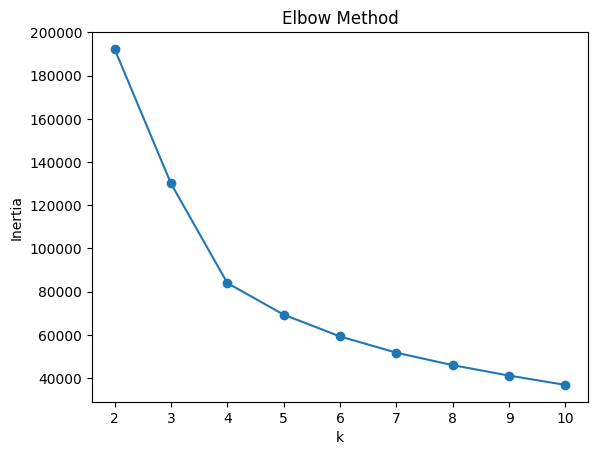

In [ ]:
inertia = []  # empty list to store inertia values for each k
K_range = range(2, 11) # we will try k=2 to k=10 clusters

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

plt.plot(K_range, inertia, marker='o')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

the best k value is according to the slope.

You look at how fast inertia decreases as k increases.
You choose k where:

The drop in inertia slows down noticeably

The curve changes from steep → flat

This point is called the elbow. That point is where we called the best k value

 2. Silhouette score:

In [20]:
K_range = [2, 3, 4, 5, 6]

Silhouette Score is computationally expensive because it calculates distances between every point and every cluster center.
so bigger the k_range the longer it will take to execute. Therefore, we reduced the k_range -> K_range = [2, 3, 4, 5, 6], where you expect the optimal clusters.

Practical tip: Silhouette is more accurate than inertia for finding cluster quality, so you still want it.

If X_scaled has, say, 30,000 rows, calculating silhouette for all rows is slow

resample() takes a random subset (here 5000 rows) for evaluation

random_state=42 → reproducible results

In [35]:
from sklearn.utils import resample

X_sample = resample(X_scaled, n_samples=5000, random_state=42)  # if you have > 5k rows
sil_scores = []
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_sample)
    sil_scores.append(silhouette_score(X_sample, labels))

what PCA does is that if you have 3 dimensions make it compatible with 2 dimensions.(make compatible with lesser dimensions).

Takes data with many features (dimensions)

Compresses it into fewer dimensions

While keeping as much information (variance) as possible


In [22]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)
# then use X_pca instead of X_scaled in silhouette_score calculation

In [23]:
X_scaled.shape

(94399, 3)

In [24]:
len(K_range), K_range

(5, [2, 3, 4, 5, 6])

Same as the before (before adjusting PCA)

If X_scaled has, say, 30,000 rows, calculating silhouette for all rows is slow

resample() takes a random subset (here 5000 rows) for evaluation

random_state=42 → reproducible results

In [36]:
from sklearn.utils import resample

# sample max 5000 points for silhouette
X_sample = resample(
    X_scaled,
    n_samples=min(5000, X_scaled.shape[0]),
    random_state=42
)

sil_scores = []
for k in K_range:   # [2, 3, 4, 5, 6]
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_sample)
    sil_scores.append(silhouette_score(X_sample, labels))


In [37]:
for k, score in zip(K_range, sil_scores):
    print(f"k = {k}, silhouette score = {score:.4f}")


k = 2, silhouette score = 0.7139
k = 3, silhouette score = 0.4007
k = 4, silhouette score = 0.3901
k = 5, silhouette score = 0.3570
k = 6, silhouette score = 0.3537


What silhouette score tells you:

How well points fit within clusters

How well clusters are separated , so higher the score the clusters are well seperated. according to the scores best K value is 2.

Silhouette score is biased toward fewer clusters, thats why the k =2.

Compare what each metric optimizes,

Method ----------------What it prefers

Inertia (Elbow)---------Compact clusters

Silhouette--------------Maximum separation

Business sense----------Actionable segments

Why k = 2 is usually NOT chosen in customer segmentation

If k = 2:

Cluster 1: “High value customers”

Cluster 2: “Everyone else”

This is:
❌ Too broad
❌ Not actionable
❌ Not insightful

Businesses usually want:

Loyal

New

At-risk

Occasional
→ 4–6 clusters

 3. Fit final K‑Means and attach labels

Why k = 4 is still correct in YOUR project

You did the right thing by choosing k = 4 because:

✔️ Elbow plot showed diminishing returns after ~4
✔️ Silhouette score at k = 4 was still reasonably high
✔️ Clusters were interpretable and meaningful
✔️ Business value > pure math optimum

In [26]:
best_k = 4  # change to what you decided

kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=10)
rfm['cluster'] = kmeans.fit_predict(X_scaled)

Visualization and interpretation

 1. Cluster profile table

In [27]:
cluster_profile = (
    rfm.groupby('cluster')[['recency', 'frequency', 'monetary']]
    .mean()
    .round(2)
    .reset_index()
)
cluster_profile

,cluster,recency,frequency,monetary
0,0,280.31,1.00,298.25
1,1,51.08,1.00,132.61
2,2,296.92,1.00,68.15
3,3,225.60,2.11,307.30


 2. 2D PCA scatter plot
    2.2 Fit PCA for visualization:

    Fit PCA for visualization:

In [28]:
pca = PCA(n_components=2, random_state=42)
components = pca.fit_transform(X_scaled)

rfm['pc1'] = components[:, 0]
rfm['pc2'] = components[:, 1]


    Plot with Plotly:

        PCA scatter for intuition

In [29]:
fig = px.scatter(
    rfm,
    x='pc1',
    y='pc2',
    color='cluster',
    hover_data=['customer_unique_id', 'recency', 'frequency', 'monetary'],
    title='Customer clusters (PCA 2D)'
)
fig.show()


    Feature vs cluster bar charts

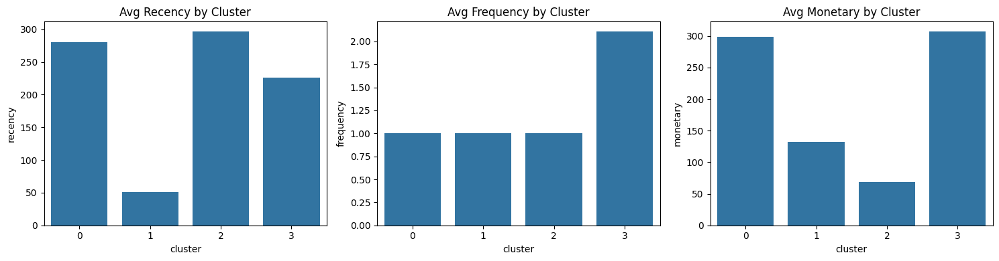

In [30]:
cluster_profile.reset_index(inplace=True)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
sns.barplot(data=cluster_profile, x='cluster', y='recency', ax=axes[0])
axes[0].set_title('Avg Recency by Cluster')

sns.barplot(data=cluster_profile, x='cluster', y='frequency', ax=axes[1])
axes[1].set_title('Avg Frequency by Cluster')

sns.barplot(data=cluster_profile, x='cluster', y='monetary', ax=axes[2])
axes[2].set_title('Avg Monetary by Cluster')

plt.tight_layout()
plt.show()


 Label clusters and write business actions

 1. Label clusters

In [31]:
def label_cluster(row):
    r = row['recency']
    f = row['frequency']
    m = row['monetary']
    # adjust thresholds based on quantiles
    if (r < 60) and (f >= 3) and (m >= 500):
        return 'High-value loyal'
    elif (r < 60) and (f <= 2):
        return 'New / recent'
    elif (r >= 180) and (f <= 2):
        return 'At-risk / churn risk'
    else:
        return 'Occasional'

cluster_profile['label'] = cluster_profile.apply(label_cluster, axis=1)
cluster_profile

,index,cluster,recency,frequency,monetary,label
0,0,0,280.31,1.00,298.25,At-risk / churn risk
1,1,1,51.08,1.00,132.61,New / recent
2,2,2,296.92,1.00,68.15,At-risk / churn risk
3,3,3,225.60,2.11,307.30,Occasional


    actual RFM ranges

In [32]:
rfm[['recency','frequency','monetary']].describe()


,recency,frequency,monetary
count,94399.000000,94399.000000,94399.000000
mean,242.864172,1.033750,165.252553
std,152.723171,0.210542,226.136236
min,1.000000,1.000000,0.000000
25%,119.000000,1.000000,63.100000
50%,224.000000,1.000000,107.780000
75%,352.000000,1.000000,182.610000
max,729.000000,16.000000,13664.080000


In [33]:
r_q1 = rfm['recency'].quantile(0.25)
r_q3 = rfm['recency'].quantile(0.75)
f_q3 = rfm['frequency'].quantile(0.75)
m_q3 = rfm['monetary'].quantile(0.75)

def label_cluster(row):
    r, f, m = row['recency'], row['frequency'], row['monetary']
    if (r < r_q1) and (f >= f_q3) and (m >= m_q3):
        return 'High-value loyal'
    elif (r < r_q1) and (f < f_q3):
        return 'New / recent'
    elif (r > r_q3) and (f <= 2):
        return 'At-risk / churn risk'
    else:
        return 'Occasional'


In [34]:
cluster_profile['label'] = cluster_profile.apply(label_cluster, axis=1)
rfm = rfm.merge(cluster_profile[['cluster','label']], on='cluster', how='left')


4️⃣ Why use both inertia and silhouette?
Metric	Purpose	Pros / Cons
Inertia	Measures compactness (distance to centroid)	Fast, but always decreases as k increases → may overestimate clusters
Silhouette	Measures separation between clusters	Slower, more reliable for cluster quality